# Сборный проект - 4
# Поиск изображения по текстовому запросу

# Описание проекта

__Заказчик:__ Хостинг для профессиональных фотографов «With Sense».

__Описание задачи:__ Фотографы размещают фотографии и сопровождают их описанием. Дополнить описание могут и другие пользователи сервиса.

__Задачи:__ Разработать демонстрационную версию поиска изображений по запросу.

__Описание данных:__

- Файл `train_dataset.csv` содержит информацию, необходимую для обучения:
  - Имя файла изображения;
  - Идентификатор описания в формате: `<имя файла изображения>#<порядковый номер описания>`;
  - Текст описания (доступно до 5 описаний);
  - Директория `/train_images/` содержит изображения для тренировки моделей.    
    
- Файл `CrowdAnnotations.tsv` включает данные по соответствию изображения и описания, полученные с помощью краудсорсинга:
  - Имя файла изображения;
  - Идентификатор описания;
  - Доля людей, подтвердивших, что описание соответствует изображению;
  - Количество человек, подтвердивших соответствие описания изображению;
  - Количество человек, подтвердивших несоответствие описания изображению.    
    
- Файл `ExpertAnnotations.tsv` включает данные по соответствию изображения и описания, полученные в результате опроса экспертов:
  - Имя файла изображения;
  - Идентификатор описания;
  - Оценки трёх экспертов по шкале от 1 до 4:
    - 1 — изображение и запрос совершенно не соответствуют друг другу;
    - 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует;
    - 3 — запрос и текст соответствуют с точностью до некоторых деталей;
    - 4 — запрос и текст соответствуют полностью.    
    
- Файл `test_queries.csv` содержит информацию, необходимую для тестирования:
  - Идентификатор запроса;
  - Текст запроса;
  - Релевантное изображение;
  - Директория `/test_images/` содержит изображения для тестирования моделей.

__Юридические ограничения:__ Поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.

# Используемые библиотеки

In [1]:
!pip install skorch -q
!pip install -U sentence-transformers -q
!pip install torch torchvision torchaudio
!pip install optuna
!pip install tf-keras
!pip install ipywidgets

In [2]:
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import pickle
import os
import re
import logging
import torch
import transformers
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
import optuna
import warnings
import tqdm
import ipywidgets as widgets

from IPython.display import display
from IPython.display import display
from PIL import Image
from rich.console import Console
from pathlib import Path
from torch.nn.utils.rnn import pad_sequence
from tqdm import notebook, tqdm
from torchvision import transforms
from torch.autograd import Variable
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer
from math import sqrt
from sklearn.model_selection import GroupShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from skorch.callbacks import EpochScoring, EarlyStopping
from skorch.dataset import ValidSplit
from skorch import NeuralNetRegressor
from sentence_transformers import SentenceTransformer, util
from torchvision.models import ResNet18_Weights

In [3]:
# константы
RANDOM_SEED = 12345
LETTERS = r'[^a-zA-Z\s]'
SPACES = r'([ ])\1+'

BASE_ROOT = 'C:/DataScience/WithMeaning/dsplus_integrated_project_4/' # корневая директория
TRAIN_IMAGES = os.path.join(BASE_ROOT, 'train_images') # путь к фотографиям для обучения
TEST_IMAGES = os.path.join(BASE_ROOT, 'test_images') # путь к фотографиям для тестирования

# настройки блокнота
pd.set_option('display.max_colwidth', None)
random.seed(RANDOM_SEED)

# экземпляр консоли
console = Console()

In [4]:
# Отдельно загрузим данные NLTK.
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import FreqDist
from nltk import pos_tag
from nltk.stem import WordNetLemmatizer

# Загрузка необходимых ресурсов
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')

# Указываем NLTK, где искать данные
nltk.data.path.append('/nltk//nltk_data')

# Теперь можно загружать необходимые данные (если они есть в указанной папке)
try:
    stopwords.words('english')  # Проверка загрузки стоп-слов
    word_tokenize("Test sentence")  # Проверка токенизатора
    print("NLTK данные успешно загружены!")
except LookupError as e:
    print(f"Ошибка: {e}. Проверьте путь к данным NLTK")

NLTK данные успешно загружены!


[nltk_data] Downloading package punkt_tab to C:\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to C:\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


# Загрузка данных

In [5]:
# функция для вывода общей информации
def general_info(data): 
    data.info()
    display(data.head())

In [6]:
# загрузка информации для обучения:
try:
    train_data = pd.read_csv(os.path.join(BASE_ROOT, 'train_dataset.csv'))
    console.print('[bold]Файл для обучения:[/bold]')
    general_info(train_data)
except:
    print('Файл для обучения не доступен')
print()

# загрузка информации для тестирования:
try:
    test_data = pd.read_csv(os.path.join(BASE_ROOT, 'test_queries.csv'), sep='|', index_col='Unnamed: 0')
    df_images = pd.read_csv(Path(BASE_ROOT, 'test_images.csv'), sep='|')
    console.print('[bold]Файл для тестирования:[/bold]')
    general_info(test_data)
    general_info(df_images)
except:
    print('Файл для тестирования не доступен')
print()

# оценка изображений на краудсорсинге
try:
    crowd_annotation = pd.read_csv(os.path.join(BASE_ROOT, 'CrowdAnnotations.tsv'), sep='\t',
                                names=['image', 'query_id', 'fraction', 'conf_cnt', 'not_conf_cnt'])
    console.print('[bold]Оценка изображений на краудсорсинге:[/bold]')
    general_info(crowd_annotation)
except:
    print('Оценка изображений на краудсорсинге не доступна')
print()

# оценка изображений экспертами
try:
    expert_annotation = pd.read_csv(os.path.join(BASE_ROOT, 'ExpertAnnotations.tsv'), sep='\t',
                                names=['image', 'query_id', 'exp_1', 'exp_2', 'exp_3'])
    console.print('[bold]Оценка изображений экспертами:[/bold]')
    general_info(expert_annotation)
except:
    print('Оценка изображений экспертами не доступна')

Файл для обучения:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .


Файл для тестирования:

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


Оценка изображений на краудсорсинге:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         47830 non-null  object 
 1   query_id      47830 non-null  object 
 2   fraction      47830 non-null  float64
 3   conf_cnt      47830 non-null  int64  
 4   not_conf_cnt  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,image,query_id,fraction,conf_cnt,not_conf_cnt
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


Оценка изображений экспертами:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp_1     5822 non-null   int64 
 3   exp_2     5822 non-null   int64 
 4   exp_3     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


,image,query_id,exp_1,exp_2,exp_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


В датасете с краудсорсинговыми оценками 47830 строк и 5 колонок:
- `image` - Имя файла изображения;
- `query_id` - Идентификатор описания;
- `fraction` - Доля людей, подтвердивших, что описание соответствует изображению;
- `conf_cnt` - Количество человек, подтвердивших, что описание соответствует изображению;
- `not_conf_cnt` - Количество человек, подтвердивших, что описание не соответствует изображению.

В датасете с оценками экспертов 5822 строки и 5 колонок:
- `image` - Имя файла изображения;
- `query_id` - Идентификатор описания;
- `exp_1`, `exp_2`, `exp_3` - Оценки экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

In [7]:
# список всех датасетов
list_data = [train_data, test_data, crowd_annotation, expert_annotation]

Проверим пропуски и дубликаты в данных.

In [8]:
print(f'Общее количество пропусков во всех датасетах: {sum(sum(col_pas for col_pas in df.isna().sum()) for df in list_data)}')
print(f'Общее количество дубликатов во всех датасетах: {sum(df.duplicated().sum() for df in list_data)}')

Общее количество пропусков во всех датасетах: 0
Общее количество дубликатов во всех датасетах: 0


Познакомимся с изображениями из датасетов.

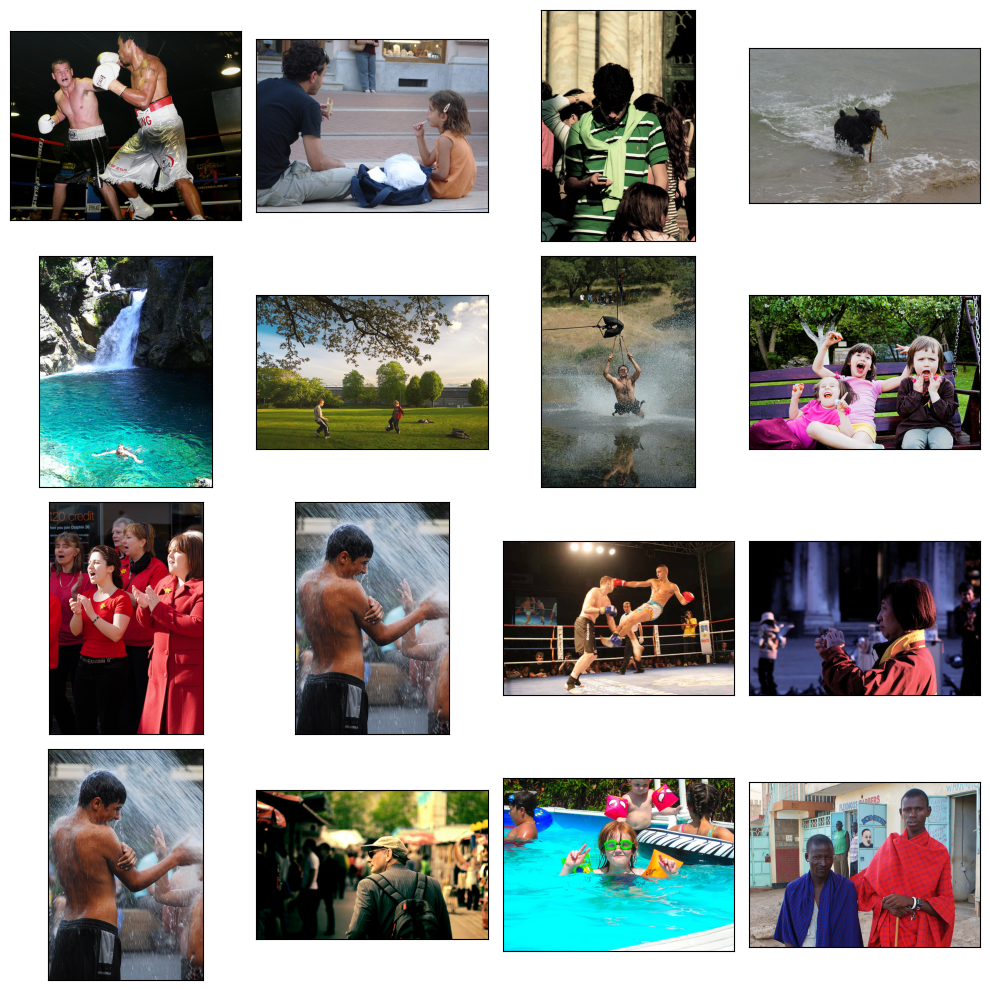

In [9]:
samples_train = list(train_data['image'].sample(8))
samples_test = list(test_data['image'].sample(8))

fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(BASE_ROOT, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(BASE_ROOT, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Выводы после загрузки данных:
- загрузили и познакомились с данными;
- пропуски в данных отсутствуют;
- дубликаты в данных отсутствуют.

## Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи мы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Мы можем воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок можно выбрать либо одну из них, либо объединить их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Наша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

Проанализируем данные по оценкам от экспертов и людей

__Датасет crowd_annotation__

In [10]:
# статистика для crowd_annotatation
console.print('[bold]Статистика для crowd_annotatation:[/bold]')
crowd_annotation.describe()

Статистика для crowd_annotatation:

,fraction,conf_cnt,not_conf_cnt
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


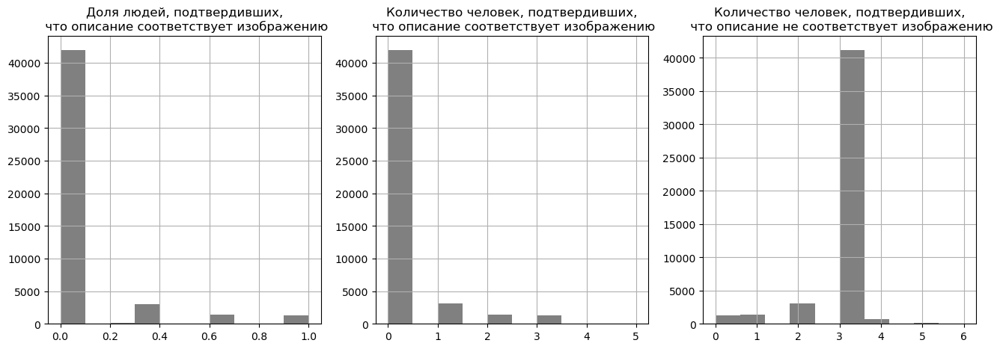

In [11]:
# визуализируем данные
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

crowd_annotation['fraction'].hist(ax=axes[0], color='grey')
axes[0].set_title("Доля людей, подтвердивших,\n что описание соответствует изображению")

crowd_annotation['conf_cnt'].hist(ax=axes[1], color='grey')
axes[1].set_title("Количество человек, подтвердивших,\n что описание соответствует изображению")

crowd_annotation['not_conf_cnt'].hist(ax=axes[2], color='grey')
axes[2].set_title("Количество человек, подтвердивших,\n что описание не соответствует изображению")

plt.show()

Проанализируем общее число оценивающих изображения:

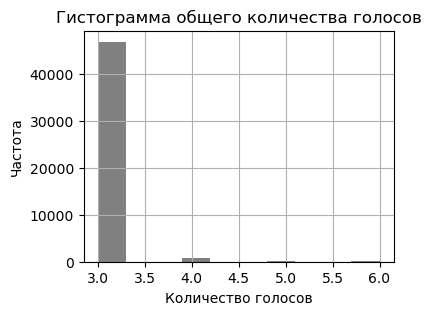

In [12]:
# вычислим сумму conf_cnt и not_conf_cnt для каждой записи
crowd_annotation['total_votes'] = crowd_annotation['conf_cnt'] + crowd_annotation['not_conf_cnt']

plt.figure(figsize=(4, 3))
crowd_annotation['total_votes'].hist(color='grey')
plt.title("Гистограмма общего количества голосов")
plt.xlabel("Количество голосов")
plt.ylabel("Частота")
plt.show()

- Низкий процент подтверждений (fraction) может указывать на слабую уверенность пользователей в том, что описание соответствует изображению;
- Существенный разброс в количестве подтверждений (conf_cnt) и неподтверждений (not_conf_cnt) может свидетельствовать о расхождении в оценках среди пользователей;
- Высокий уровень неподтверждений (not_conf_cnt) может быть следствием некорректного описания изображения.

__Датасет expert_annotation__

In [13]:
# статистика для expert_annotation
console.print('[bold]Статистика для expert_annotation:[/bold]')
expert_annotation.describe()

Статистика для expert_annotation:

,exp_1,exp_2,exp_3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


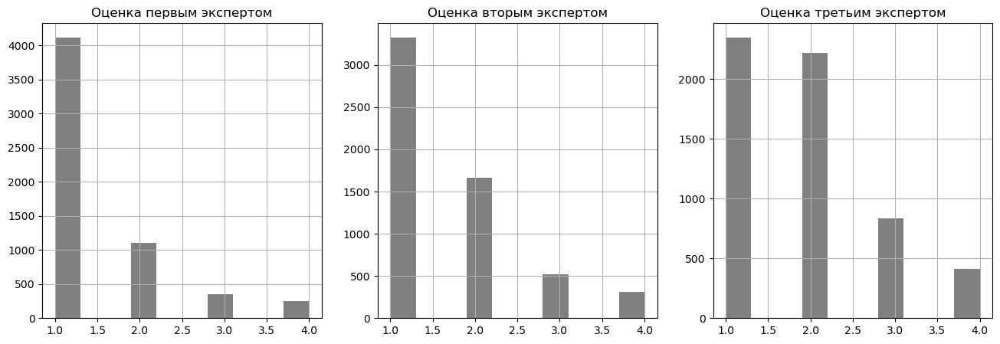

In [14]:
# визуализация данных
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

expert_annotation['exp_1'].hist(ax=axes[0], color='grey')
axes[0].set_title("Оценка первым экспертом")

expert_annotation['exp_2'].hist(ax=axes[1], color='grey')
axes[1].set_title("Оценка вторым экспертом")

expert_annotation['exp_3'].hist(ax=axes[2], color='grey')
axes[2].set_title("Оценка третьим экспертом")

plt.show()

Информация, полученная от экспертов, менее подвержена низким оценкам и характеризуется меньшей изменчивостью.

Создадим функцию для агрегации оценок, предоставленных экспертами, и применим её к нашему набору данных. В случае, если все оценки различны, мы будем усреднять их и приводить к диапазону от 0 до 1. Если же в наборе есть несколько одинаковых оценок, то будем исходить из принципа большинства.

In [15]:
def expert_mark_aggregate(row) -> object:
    
    if row['exp_1'] != row['exp_2'] != row['exp_3']: # если оценки разные, усредним
        row['expert_mark'] = (row['exp_1'] + row['exp_2'] + row['exp_3'] - 3) / 3 / 3
    else: # если есть одинаковые оценки, исходим из принципа большинства
        row['expert_mark'] = (max(set([row['exp_1'],
                                        row['exp_2'],
                                        row['exp_3']]),
                                   key = [row['exp_1'],
                                          row['exp_2'],
                                          row['exp_3']].count) - 1) / 3
    return row

In [16]:
expert_annotation = expert_annotation.apply(expert_mark_aggregate, axis=1)

Так как не все сочетания изображение-описание располагают оценками как от пользователей, так и от экспертов, мы объединим оба блока оценок с помощью флага `outer`. Это позволит получить оценки экспертов для некоторых пар (считаем их более надежными), оценки пользователей для других, а для оставшихся будет представлена смешанная оценка.

In [17]:
marks_data = pd.merge(expert_annotation, crowd_annotation, how='outer', on=['image', 'query_id'])

def aggregate_mark_total(row) -> object:

    if np.isnan(row['expert_mark']):
        row['mark'] = row['fraction']
    elif np.isnan(row['fraction']):
        row['mark'] = row['expert_mark']
    else:
        row['mark'] = row['expert_mark'] * 0.7 + row['fraction'] * 0.3
        
    return row

In [18]:
marks_data = marks_data.apply(aggregate_mark_total, axis=1)

In [19]:
marks_data.head()

,image,query_id,exp_1,exp_2,exp_3,expert_mark,fraction,conf_cnt,not_conf_cnt,total_votes,mark
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,NaN,1.0,3.0,0.0,3.0,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0,3.0,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0,3.0,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0,3.0,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0,3.0,0.0


In [20]:
marks_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         51323 non-null  object 
 1   query_id      51323 non-null  object 
 2   exp_1         5822 non-null   float64
 3   exp_2         5822 non-null   float64
 4   exp_3         5822 non-null   float64
 5   expert_mark   5822 non-null   float64
 6   fraction      47830 non-null  float64
 7   conf_cnt      47830 non-null  float64
 8   not_conf_cnt  47830 non-null  float64
 9   total_votes   47830 non-null  float64
 10  mark          51323 non-null  float64
dtypes: float64(9), object(2)
memory usage: 4.3+ MB


Оставим только необходимые нам колонки.

In [21]:
marks_data = marks_data[['image', 'query_id', 'mark']] 

Создадим датасет с уникальными парами `query_id`-`query_text`.

In [22]:
unique_combinations = train_data[['query_id', 'query_text']].drop_duplicates().reset_index(drop=True)

In [23]:
# объединим датасеты
new_marks = marks_data.merge(
    unique_combinations,
    on='query_id',
    how='left'
)
new_marks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   mark        51323 non-null  float64
 3   query_text  50214 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


In [24]:
# удалим пропуски
new_marks = new_marks.dropna(subset=['query_text'])
new_marks.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   mark        50214 non-null  float64
 3   query_text  50214 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


In [25]:
train_data = new_marks

Вывод после исследовательского анализа данных:
- объединили все оценки, интегрировав их с обучающим набором данных;
- избавились от значений NaN.

# Проверка данных. Юридические ограничения

Поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.

В данных отсутсвует информация о возрасте людей на фотографиях, нет прямой возможности очистить от них данные:
- для избавления от нелегального контента мы воспользуемся текстовыми описаниями файлов;
- объявим список слов для поиска нелегального контента;
- очистим, токенизируем и лемматизируем текст, чтобы было легче искать запросы связанные с детьми.
- отметим в обучающем наборе фото подлежащие блокировке.

In [26]:
# стоп-слова
BLOCK = ['teenage',
         'baby',
         'child',
         'teenager',
         'girl',
         'boy',
         'kid',
         'young girl',
         'young boy',
         'little boy',
         'little girl'
        ]

In [27]:
lemmatize = nltk.WordNetLemmatizer()

def get_lemm(text) -> list:

# очищаем текст и превращаем в список лемм

    text = re.sub('[^a-zA-Z]', ' ', text).lower() # удаляем неалфавитные символы, приводим к нижнему регистру
    text = nltk.word_tokenize(text, language = 'english') # токенизируем слова
    text = [lemmatize.lemmatize(word) for word in text] # лемматирзируем слова

    return text

def cleaning(row) -> object:

# отмечаем тексты для блокирования

    text = get_lemm(row['query_text'])
    if [i for i in text if i in BLOCK]:
        row['to_block'] = 1
    else:
        row['to_block'] = 0

    return row

In [28]:
train_data = train_data.apply(cleaning, axis=1)

Выведем на экран описание тех изображений, которые мы отправили в бан, а также случайные изображения, которые оказались нами заблокированными.

In [29]:
print(train_data[train_data['to_block'] == 1]['query_text'].sample(10).unique())

['Two girls are sitting on a path by a river with their bicycles parked beside them .'
 'A little boy is jumping into an outdoor kiddie pool'
 'Two children look up .' 'A child is smiling while being on a swing .'
 'Two girls walking down the street .'
 'A boy jumps from one bed to another .'
 'Two kids playing on a pebble beach by the water'
 'A little boy is jumping out of the pool .'
 'A boy in swim trunks screams while being sprayed with water .'
 'A child running with a snowboard on a snow covered surface .']


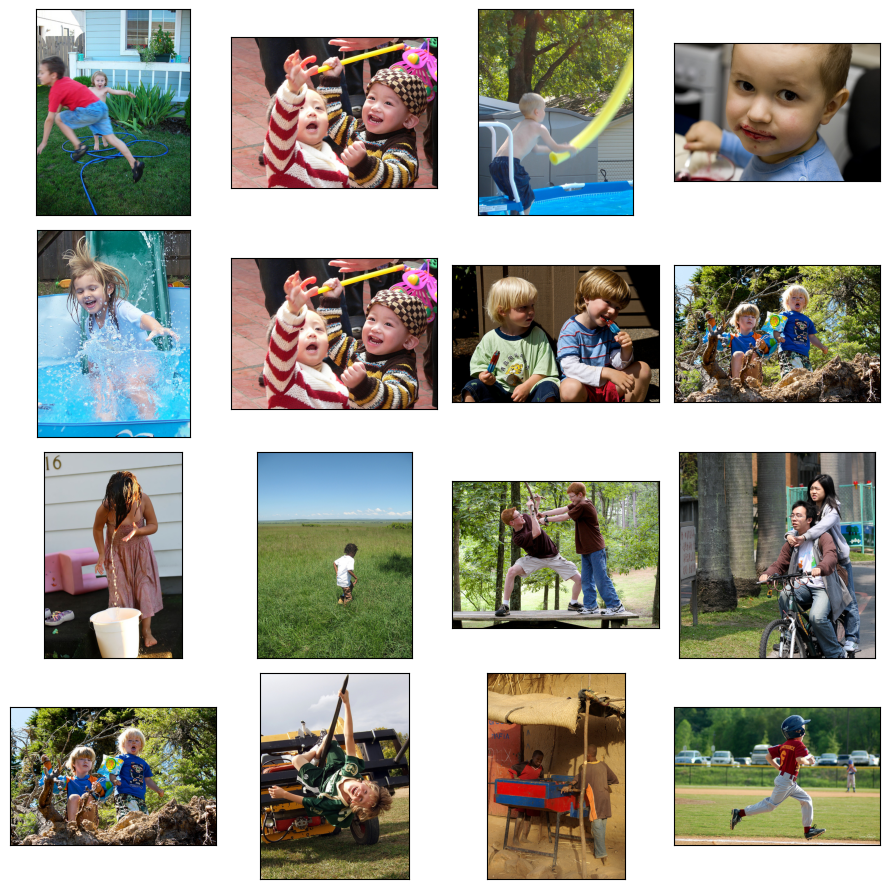

In [30]:
samples = list(train_data[train_data['to_block'] == 1]['query_id'].sample(16))
samples = [i[:-2] for i in samples]

fig = plt.figure(figsize=(9,9))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(BASE_ROOT, 'train_images', samples[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Судя по всему мы всё сделали правильно. Поэтому удалим строки с детскими фото из датасета.

In [31]:
# список изображений для исключения
images_to_block = train_data[train_data['to_block'] == 1]['query_id'].str[:-2].unique()

In [32]:
filtered_data = train_data[~train_data['image'].isin(images_to_block)][['image', 'query_id', 'query_text','mark']].copy()

In [33]:
print(f'Удалено {len(train_data)-len(filtered_data)} изображений с детьми')

Удалено 14109 изображений с детьми


In [34]:
train_data = filtered_data

Вывод после проверки данных на юридические ограничения:
- проверили данные и исключили из обучения все изображения, содержащие детей младше 18 лет. 

# Векторизация изображений

Рассмотрим свёрточные нейронные сети, которые способны "извлекать" основные компоненты изображений. Мы выберем архитектуру `ResNet-18` и уберём из неё лишь последний слой. Для этого загрузим заранее обученную модель этой архитектуры, которая была натренирована на наборе данных `ImageNet`. 

Загрузим и настроим модель.

In [35]:
resnet = models.resnet18(pretrained=True) # загружаем предтренированную модель 

for param in resnet.parameters():
    param.requires_grad_(False) #заморозка весов

# удалим только последний слой
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules)

resnet.eval() #режим предсказания

# центрирование и нормализация изображения
norm = transforms.Normalize(
    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
]) 

C:\Users\avrev\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\avrev\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [36]:
# выделим уникальные изображения
train_images_list = train_data['image'].unique()

In [37]:
# создадим векторы
vectors = []

for image_name in notebook.tqdm(train_images_list):
    image = Image.open(os.path.join(TRAIN_IMAGES, image_name)).convert('RGB')
    image = preprocess(image)
    image = Variable(image.unsqueeze(0))

    vector = resnet(image).cpu().flatten().numpy()
    vectors.append(vector)

  0%|          | 0/715 [00:00<?, ?it/s]

In [38]:
# получим эмбеддинги
images_embeds = np.array(vectors)

In [39]:
images_embeds.shape

(715, 512)

In [40]:
image_vect = pd.DataFrame({'image': train_images_list, 'image_vector': images_embeds.tolist()})
# объединение векторов изображений с набором данных
train_data = train_data.merge(image_vect, on='image', how='left')

Выполнили векторизацию изображений.

# Векторизация текстов

Для векторизации тектов применим модель `all-MiniLM-L6-v2`.

Напишем функцию для получения эмбеддингов.

In [41]:
def vectorize_text(model, data, batch_size=224, bar=True, verbose=0) -> np.array:
    
    embeddings = []
    texts = data.tolist() if hasattr(data, 'tolist') else data
    
    if bar:
        for i in notebook.tqdm(range(0, len(texts), batch_size), desc="Обработка", unit="query"):
            batch = texts[i:i+batch_size]
            batch_embeddings = model.encode(batch, 
                                          convert_to_numpy=True,
                                          show_progress_bar=False)
            embeddings.append(batch_embeddings)
    else:
        for i in range(0, len(texts), batch_size):
            batch = texts[i:i+batch_size]
            batch_embeddings = model.encode(batch, 
                                          convert_to_numpy=True,
                                          show_progress_bar=False)
            embeddings.append(batch_embeddings)
    
    return np.concatenate(embeddings)

Преобразуем наши тексты для подачи в функцию.

Запустим получение эмбеддингов.

In [42]:
model = SentenceTransformer('all-MiniLM-L6-v2')
text_embeds = vectorize_text(model, train_data['query_text'])

Обработка:   0%|          | 0/162 [00:00<?, ?query/s]

In [43]:
text_embeds.shape

(36105, 384)

In [44]:
# дополнение датасета эмбедингами
train_data['text_embeddings'] = text_embeds.tolist()

Загрузили модель `all-MiniLM-L6-v2` и получили эмбеддинги для текстов.

# Объединение векторов

Приступим к подготовке данных для обучения. Для этого объединим векторы изображений и векторы текстов.

In [45]:
train_data['concat_vector'] = train_data.apply(lambda row: np.concatenate([row['text_embeddings'],
                                                                             row['image_vector']], axis=None), axis=1)

In [46]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36105 entries, 0 to 36104
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            36105 non-null  object 
 1   query_id         36105 non-null  object 
 2   query_text       36105 non-null  object 
 3   mark             36105 non-null  float64
 4   image_vector     36105 non-null  object 
 5   text_embeddings  36105 non-null  object 
 6   concat_vector    36105 non-null  object 
dtypes: float64(1), object(6)
memory usage: 1.9+ MB


Подготовили данные к обучению моделей.

# Обучение моделей

Для подготовки данных к обучению важно разделить датасет на тренировочную и тестовую выборки так, чтобы ни одно изображение не попало в обе выборки одновременно. Простое случайное разбиение не подойдет в данном случае. Вместо этого мы можем воспользоваться классом `GroupShuffleSplit` из библиотеки `sklearn.model_selection`. Этот подход позволяет учитывать группу изображений при разбиении наборов данных.

Начнем с получения обучающей и валидационной выборок, чтобы правильно организовать процесс обучения и оценивания модели.

In [47]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=RANDOM_SEED)
train_indices, test_indices = next(gss.split(X=train_data.drop(columns=['query_id',
                                                                      'query_text',
                                                                      'mark',
                                                                      'image_vector',
                                                                      'text_embeddings']),
                                             y=train_data['mark'], groups=train_data['image']))

In [48]:
train_data, valid_data = train_data.loc[train_indices], train_data.loc[test_indices]

Разделим данные на признаки (X) и целевую переменную (y).

In [49]:
X_train = train_data['concat_vector'].apply(pd.Series).values
y_train = train_data['mark']

X_valid = valid_data['concat_vector'].apply(pd.Series).values
y_valid = valid_data['mark']

Выполним масштабирование данных.

In [50]:
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_valid = scaler.transform(X_valid)

In [51]:
X_train.shape

(29063, 896)

Мы проведем сравнительный анализ моделей, обученных с использованием разных алгоритмов, включая линейную регрессию и нейросеть, созданную с помощью фреймворка PyTorch. Для оценки качества моделей будем использовать метрику RMSE (корень из среднеквадратичной ошибки).

Основное преимущество RMSE заключается в том, что она имеет ту же размерность, что и исходные данные, что значительно упрощает интерпретацию полученных результатов. Таким образом, мы сможем более наглядно оценить производительность каждой из моделей.

In [52]:
# функция для расчета RMSE
def rmse_score(values, predict):
    return sqrt(mean_squared_error(values, predict))

rmse_scorer = make_scorer(rmse_score)

# функция для вывода результатов
def results(trial):
    print('Результаты подбора параметров:')
    print('  RMSE:', round(trial.value, 3))
    print('  Params: ')
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))

## Baseline model

Используем базовую модель для оценки адекватности и производительности модели.

In [53]:
# константная модель, предсказывает среднее значение
dummy_model = DummyRegressor(strategy="mean")

dummy_model.fit(X_train, y_train)

# предсказание
dummy_pred = dummy_model.predict(X_valid)

# оценка производительности
rmse = rmse_score(y_valid, dummy_pred)
print(f'RMSE(Dummy Model): {rmse}')

RMSE(Dummy Model): 0.2099862985434901


## LinearRegression

In [54]:
# создание и обучение модели LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

# прогнозирование
y_pred = model.predict(X_valid)

# оценка модели
print(f'RMSE: {rmse_score(y_valid, y_pred)}')

RMSE: 0.24974352722243534


Как и ожидалось, обучение линейной модели привело к неадекватным результатам на валидационных данных. 
Существует несколько возможных причин такого поведения.

Во-первых, линейная регрессия подразумевает наличие линейной зависимости между признаками и целевой переменной. Если же в действительности зависимость между ними является нелинейной, линейная модель не сможет адекватно отразить структуры данных.

Во-вторых, недостаток обучающих данных также может послужить причиной низкой точности модели. Если объём доступных данных слишком мал, линейная регрессия не сможет получить достаточно информации для формирования качественных прогнозов.

## NeuralNetwork

In [55]:
# проверяем доступность MPS
if torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [56]:
# Преобразование выборок в тензоры
X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32) if hasattr(X_train, 'values') else torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).reshape(-1, 1) if hasattr(y_train, 'values') else torch.tensor(y_train, dtype=torch.float32).reshape(-1, 1)
X_valid_tensor = torch.tensor(X_valid.values, dtype=torch.float32) if hasattr(X_valid, 'values') else torch.tensor(X_valid, dtype=torch.float32)
y_valid_tensor = torch.tensor(y_valid.values, dtype=torch.float32).reshape(-1, 1) if hasattr(y_valid, 'values') else torch.tensor(y_valid, dtype=torch.float32).reshape(-1, 1)

# Проверка размерности и типа данных тензоров
tensors = {
    'X_train_tensor': X_train_tensor,
    'y_train_tensor': y_train_tensor,
    'X_valid_tensor': X_valid_tensor,
    'y_valid_tensor': y_valid_tensor
}

for name, tensor in tensors.items():
    print(f'Размерность {name}: {tensor.shape} - {tensor.dtype}')

Размерность X_train_tensor: torch.Size([29063, 896]) - torch.float32
Размерность y_train_tensor: torch.Size([29063, 1]) - torch.float32
Размерность X_valid_tensor: torch.Size([7042, 896]) - torch.float32
Размерность y_valid_tensor: torch.Size([7042, 1]) - torch.float32


Для формирования пакетов данных применяется Dataloader, который предлагает удобный и эффективный способ загрузки и предварительной обработки данных во время обучения моделей машинного обучения. Этот компонент в PyTorch позволяет задавать различные настройки для управления процессом загрузки, включая размер пакета (batch size) и количество рабочих потоков для параллельной загрузки данных (num_workers). Это позволяет оптимизировать подачу данных на этапе обучения и улучшить общую производительность модели.

In [57]:
# класс для создания пакетов
class Batch(Dataset):
    def __init__(self, data, labels):
        self.labels = labels
        self.data = data

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        label = self.labels[idx]
        data = self.data[idx]
        sample = {'data': data, 'mean_exp': label}
        return sample

In [58]:
dataset_train = Batch(X_train_tensor, y_train_tensor)
dataset_test = Batch(X_valid_tensor, y_valid_tensor)

In [59]:
# определение архитектуры нейронной сети
class Baseline(nn.Module):
    def __init__(self, input_size, hidden_size_1, hidden_size_2, hidden_size_3, hidden_size_4, output_size,
                 drop_1, drop_2, drop_3, drop_4,
                 activation_1, activation_2, activation_3, activation_4):
        super(Baseline, self).__init__()

        self.fc1 = nn.Linear(input_size, hidden_size_1)
        self.act1 = activation_1
        self.drop1 = nn.Dropout(drop_1)

        self.fc2 = nn.Linear(hidden_size_1, hidden_size_2)
        self.act2 = activation_2
        self.drop2 = nn.Dropout(drop_2)

        self.fc3 = nn.Linear(hidden_size_2, hidden_size_3)
        self.act3 = activation_3
        self.drop3 = nn.Dropout(drop_3)

        self.fc4 = nn.Linear(hidden_size_3, hidden_size_4)
        self.act4 = activation_4
        self.drop4 = nn.Dropout(drop_4)

        self.fc5 = nn.Linear(hidden_size_4, output_size)

        self.init_weights()

    def forward(self, x):
        x = self.drop1(self.act1(self.fc1(x)))
        x = self.drop2(self.act2(self.fc2(x)))
        x = self.drop3(self.act3(self.fc3(x)))
        x = self.drop4(self.act4(self.fc4(x)))
        x = self.fc5(x)
        return x

    def init_weights(m):
        if isinstance(m, nn.Linear):
            torch.nn.init.kaiming_normal_(m.weight)
            m.bias.data.fill_(0.01)

In [60]:
class CustomEarlyStopping():
    """
    Ранняя остановка: остановить тренировку, если функция потерь не улучшается после определенного количества эпох.
    """
    def __init__(self, patience=5, min_delta=0):
        """
        :param patience: сколько эпох ждать, прежде чем остановиться
        :param min_delta: минимальная разница функций потерь для активации param patience
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif self.best_loss - val_loss > self.min_delta:  # обновление значения функция потерь при улучшении
            self.best_loss = val_loss
            self.counter = 0
        elif self.best_loss - val_loss < self.min_delta:  # счетчик patience при ухудшении функция потерь
            self.counter += 1
            if self.counter >= self.patience:
                print(f'INFO: Ранняя остановка. Счетчик: {self.counter}/{self.patience}')
                self.early_stop = True  # остановка обучения при достижении максимума счетсика patience

Функция для обучения.

In [61]:
def train(model, train_dataloader, test_dataloader, optimizer, loss, n_epochs, patience, min_delta):

    result = {'rmse_train': [],
             'rmse_test': [],
             'best_epoch': None,
             'stopping_epoch': None,
             'best_model': None}

    early_stopping = CustomEarlyStopping(patience, min_delta)
    for epoch in range(n_epochs):
        # обучение
        model.train()
        total_loss = 0.0
        for batch in train_dataloader:
            data = batch['data']
            label_train = batch['mean_exp']

            optimizer.zero_grad()

            predictions = model.forward(data).flatten()
            loss_value = loss(predictions, label_train)
            total_loss += loss_value.item()

            loss_value.backward()
            optimizer.step()

        rmse_tr = sqrt(total_loss/len(train_dataloader))
        result['rmse_train'].append(rmse_tr)

        # тестирование
        model.eval()
        total_loss = 0.0
        with torch.no_grad(): # отключаем вычисление градиентов
            for batch in test_dataloader:
                data = batch['data']
                label_test = batch['mean_exp']

                predictions = model.forward(data).flatten()
                loss_value = loss(predictions, label_test)
                total_loss += loss_value
            rmse_ts = sqrt(total_loss/len(test_dataloader))
            result['rmse_test'].append(rmse_ts)

        if epoch % 10 == 0 or epoch == n_epochs - 1:
             print(f'Epoch: {epoch} RMSE_train: {round(rmse_tr, 4)} RMSE_test: {round(rmse_ts, 4)}')

        early_stopping(rmse_ts)
        if early_stopping.counter == 1:
            result['best_model'] = model
        if early_stopping.early_stop:
            result['best_epoch'] = epoch-patience
            result['stopping_epoch'] = epoch
            print(f"Best epoch: {epoch-patience} RMSE_train: {round(result['rmse_train'][-patience], 4)} RMSE_test: {round(result['rmse_test'][-patience], 4)}")
            break
        if epoch == n_epochs-1:
            result['best_epoch'] = epoch
            result['stopping_epoch'] = epoch
            print(f"Best epoch: {epoch} RMSE_train: {round(result['rmse_train'][-1], 4)} RMSE_test: {round(result['rmse_test'][-1], 4)}")
    return result

In [62]:
# зададим параметры нейронной сети

# размер слоев
input_size = X_train_tensor.shape[1]
hidden_size_1 = 1024
hidden_size_2 = 512
hidden_size_3 = 256
hidden_size_4 = 128
output_size = 1

# функции активации
activation_1 = nn.ReLU()
activation_2 = nn.Tanh()
activation_3 = nn.ReLU()
activation_4 = nn.LeakyReLU()

# вероятности выключения нейронов в слое
drop_1 = 0.1
drop_2 = 0.0
drop_3 = 0.0
drop_4 = 0.0

learning_rate = 0.01  # скорость обучения
n_epochs = 40  # количество эпох обучения
batch_size = 32  # размер пакета

In [63]:
# экземпляр нейронной сети
model = Baseline(input_size, hidden_size_1, hidden_size_2, hidden_size_3, hidden_size_4, output_size,
                 drop_1, drop_2, drop_3, drop_4,
                 activation_1, activation_2, activation_3, activation_4)
# функция потерь
loss = nn.MSELoss()
# оптимизатор
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
# пакеты (batch)
train_dataloader = DataLoader(dataset_train, batch_size=batch_size, shuffle=True,
                              num_workers=0)
test_dataloader = DataLoader(dataset_test, batch_size=batch_size, num_workers=0)

In [64]:
# обучение и сохранение результатов
result = train(model=model,
               train_dataloader=train_dataloader,
               test_dataloader=test_dataloader,
               optimizer=optimizer,
               loss=loss,
               n_epochs=n_epochs,
               patience=20,
               min_delta=0)

C:\Users\avrev\anaconda3\Lib\site-packages\torch\nn\modules\loss.py:610: UserWarning: Using a target size (torch.Size([32, 1])) that is different to the input size (torch.Size([32])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\avrev\anaconda3\Lib\site-packages\torch\nn\modules\loss.py:610: UserWarning: Using a target size (torch.Size([7, 1])) that is different to the input size (torch.Size([7])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\avrev\anaconda3\Lib\site-packages\torch\nn\modules\loss.py:610: UserWarning: Using a target size (torch.Size([2, 1])) that is different to the input size (torch.Size([2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(i

Epoch: 0 RMSE_train: 0.2923 RMSE_test: 0.2094
Epoch: 10 RMSE_train: 0.2226 RMSE_test: 0.2095
Epoch: 20 RMSE_train: 0.2227 RMSE_test: 0.2096
Epoch: 30 RMSE_train: 0.2226 RMSE_test: 0.2094
INFO: Ранняя остановка. Счетчик: 20/20
Best epoch: 12 RMSE_train: 0.2226 RMSE_test: 0.2094


Нейросеть показывает уверенные результаты в прогнозировании.

In [65]:
# Улучшение нейронной сети
def objective(trial):

    # dropout
    drop_1 = trial.suggest_float('module__drop_1', 0.0, 0.4, step=0.2)
    drop_2 = trial.suggest_float('module__drop_2', 0.0, 0.4, step=0.2)
    drop_3 = trial.suggest_float('module__drop_3', 0.0, 0.4, step=0.2)
    drop_4 = trial.suggest_float('module__drop_4', 0.0, 0.4, step=0.2)

    # функции активации
    activation_dict = {'nn.LeakyReLU()': nn.LeakyReLU(),
                       'nn.ReLU()': nn.ReLU(),
                       'nn.Tanh()': nn.Tanh(),
                       'nn.ELU()': nn.ELU()
                      }

    activation_1 = trial.suggest_categorical('module__activation_1', ['nn.LeakyReLU()', 'nn.ReLU()', 'nn.Tanh()', 'nn.ELU()'])
    activation_2 = trial.suggest_categorical('module__activation_2', ['nn.LeakyReLU()', 'nn.ReLU()', 'nn.Tanh()', 'nn.ELU()'])
    activation_3 = trial.suggest_categorical('module__activation_3', ['nn.LeakyReLU()', 'nn.ReLU()', 'nn.Tanh()', 'nn.ELU()'])
    activation_4 = trial.suggest_categorical('module__activation_4', ['nn.LeakyReLU()', 'nn.ReLU()', 'nn.Tanh()', 'nn.ELU()'])

    activation_1 = activation_dict.get(activation_1)
    activation_2 = activation_dict.get(activation_2)
    activation_3 = activation_dict.get(activation_3)
    activation_4 = activation_dict.get(activation_4)


    # количество нейронов
    input_size = X_train_tensor.shape[1]
    output_size = 1

    hidden_size_1 = trial.suggest_int('module__hidden_size_1', 128, 2048,  step=128)
    hidden_size_2 = trial.suggest_int('module__hidden_size_2', 64, 1024,  step=64)
    hidden_size_3 = trial.suggest_int('module__hidden_size_3', 32, 512,  step=32)
    hidden_size_4 = trial.suggest_int('module__hidden_size_4', 16, 240,  step=16)



    # скорость обучения
    lr = trial.suggest_float('learning_rate', 1e-6, 1e-0, log=True)

    # размер пакета обучения
    batch_size = trial.suggest_int('batch_size', 32, 512,  step=32)

    # модель
    model_base = Baseline(input_size, hidden_size_1, hidden_size_2, hidden_size_3, hidden_size_4, output_size,
                          drop_1, drop_2, drop_3, drop_4,
                          activation_1, activation_2, activation_3, activation_4)

    # количество шагов до остановки обучения
    patience = trial.suggest_int('patience', 10, 40,  step=10)

    # параметры подбора параметров модели
    skorch_regressor = NeuralNetRegressor(module=model_base,
                                      device=device,
                                      verbose=0,
                                      batch_size=batch_size,
                                      optimizer=torch.optim.Adam,
                                      max_epochs=1000,
                                      lr=lr,
                                      criterion = nn.MSELoss,
                                      callbacks=[
                ('val_rmse', EpochScoring(scoring=rmse_scorer, lower_is_better=True, name='RMSE')),
                ('estoper', EarlyStopping( lower_is_better=True, monitor='RMSE', patience=patience))
            ]
                                     )



    rmse = cross_val_score(skorch_regressor, X_train_tensor.numpy(),
                            y_train_tensor.numpy().reshape(-1, 1),
                            n_jobs=-1,
                            cv=4,
                            scoring=rmse_scorer)
    rmse = rmse.mean()
    
    return rmse

In [66]:
# Настройка логирования Optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)
# экземпляр study
study = optuna.create_study(direction='minimize')
# количество итераций
n_trials = 30

# прогресс бар с использованием tqdm
for _ in tqdm(range(n_trials), desc="Optimizing", ncols=100):
    study.optimize(objective, n_trials=1, show_progress_bar=False)

Optimizing: 100%|████████████████████████████████████████████████| 30/30 [4:17:45<00:00, 515.51s/it]


In [67]:
# вывод результатов
trial = study.best_trial
results(trial)

Результаты подбора параметров:
  RMSE: 0.204
  Params: 
    module__drop_1: 0.0
    module__drop_2: 0.0
    module__drop_3: 0.0
    module__drop_4: 0.2
    module__activation_1: nn.Tanh()
    module__activation_2: nn.LeakyReLU()
    module__activation_3: nn.LeakyReLU()
    module__activation_4: nn.ELU()
    module__hidden_size_1: 1664
    module__hidden_size_2: 576
    module__hidden_size_3: 352
    module__hidden_size_4: 48
    learning_rate: 5.709583463865053e-05
    batch_size: 256
    patience: 30


Обучение модели с лучшими гиперпараметрами.

In [68]:
# инициализация оптимальных параметров
best_params = study.best_params
# инициализация оптимальных параметров
activation_dict = {'nn.LeakyReLU()': nn.LeakyReLU(),
                       'nn.ReLU()': nn.ReLU(),
                       'nn.Tanh()': nn.Tanh(),
                       'nn.ELU()': nn.ELU()
                      }

input_size = X_train.shape[-1]
output_size = 1

hidden_size_1 = best_params['module__hidden_size_1']
hidden_size_2 = best_params['module__hidden_size_2']
hidden_size_3 = best_params['module__hidden_size_3']
hidden_size_4 = best_params['module__hidden_size_4']

drop_1 = round(best_params['module__drop_1'], 1)
drop_2 = round(best_params['module__drop_2'], 1)
drop_3 = round(best_params['module__drop_3'], 1)
drop_4 = round(best_params['module__drop_4'], 1)

activation_1 = best_params['module__activation_1']
activation_2 = best_params['module__activation_2']
activation_3 = best_params['module__activation_3']
activation_4 = best_params['module__activation_4']

activation_1 = activation_dict.get(activation_1)
activation_2 = activation_dict.get(activation_2)
activation_3 = activation_dict.get(activation_3)
activation_4 = activation_dict.get(activation_4)

learning_rate = best_params['learning_rate']

batch_size = best_params['batch_size']

patience = best_params['patience']

best_model = Baseline(input_size, hidden_size_1, hidden_size_2, hidden_size_3, hidden_size_4, output_size,
                          drop_1, drop_2, drop_3, drop_4,
                          activation_1, activation_2, activation_3, activation_4)

best_regressor = NeuralNetRegressor(module=best_model, device=device, verbose=0,
                                           batch_size=best_params['batch_size'], optimizer=torch.optim.Adam,
                                           max_epochs=2500, lr=best_params['learning_rate'], criterion=nn.MSELoss,
                                           callbacks=[('val_rmse', EpochScoring(scoring=rmse_scorer, lower_is_better=True, name='RMSE')),
                                                      ('estoper', EarlyStopping(lower_is_better=True, monitor='RMSE', patience=best_params['patience']))])

best_regressor.fit(X_train_tensor, y_train_tensor.reshape(-1,1))

<class 'skorch.regressor.NeuralNetRegressor'>[initialized](
  module_=Baseline(
    (fc1): Linear(in_features=896, out_features=1664, bias=True)
    (act1): Tanh()
    (drop1): Dropout(p=0.0, inplace=False)
    (fc2): Linear(in_features=1664, out_features=576, bias=True)
    (act2): LeakyReLU(negative_slope=0.01)
    (drop2): Dropout(p=0.0, inplace=False)
    (fc3): Linear(in_features=576, out_features=352, bias=True)
    (act3): LeakyReLU(negative_slope=0.01)
    (drop3): Dropout(p=0.0, inplace=False)
    (fc4): Linear(in_features=352, out_features=48, bias=True)
    (act4): ELU(alpha=1.0)
    (drop4): Dropout(p=0.2, inplace=False)
    (fc5): Linear(in_features=48, out_features=1, bias=True)
  ),
)

In [69]:
# вычисление RMSE на валидационных данных
y_pred_valid = best_regressor.predict(X_valid_tensor)

print(f"RMSE на валидационных данных: {rmse_score(y_valid, y_pred_valid):.4f}")

RMSE на валидационных данных: 0.1973


Нейронная сеть показала наилучшую метрику

Финальная модель, которая обучена на всех данных

In [70]:
# обучающие и валидационные данные
X_combined = torch.cat((X_train_tensor, X_valid_tensor), dim=0)
y_combined = torch.cat((y_train_tensor.reshape(-1, 1), y_valid_tensor.reshape(-1, 1)), dim=0)

# модель обученная на всех данных
best_regressor.fit(X_combined, y_combined)

<class 'skorch.regressor.NeuralNetRegressor'>[initialized](
  module_=Baseline(
    (fc1): Linear(in_features=896, out_features=1664, bias=True)
    (act1): Tanh()
    (drop1): Dropout(p=0.0, inplace=False)
    (fc2): Linear(in_features=1664, out_features=576, bias=True)
    (act2): LeakyReLU(negative_slope=0.01)
    (drop2): Dropout(p=0.0, inplace=False)
    (fc3): Linear(in_features=576, out_features=352, bias=True)
    (act3): LeakyReLU(negative_slope=0.01)
    (drop3): Dropout(p=0.0, inplace=False)
    (fc4): Linear(in_features=352, out_features=48, bias=True)
    (act4): ELU(alpha=1.0)
    (drop4): Dropout(p=0.2, inplace=False)
    (fc5): Linear(in_features=48, out_features=1, bias=True)
  ),
)

# Тестирование модели

Пришло время провести тестирование модели. Для этого мы извлечем эмбеддинги всех тестовых изображений из папки `test_images`, а затем случайным образом выберем 10 запросов из файла `test_queries.csv`. Для каждого из этих запросов мы определим наиболее подходящее изображение и проведем визуальное сравнение качества поиска.

In [71]:
# список тестовых изображений
test_images_list = test_data['image'].unique()

Получим эмбеддинги тестовых картинок.

In [72]:
# создание векторов
test_vectors = []

for image_name in notebook.tqdm(test_images_list):
    image = Image.open(os.path.join(TEST_IMAGES, image_name)).convert('RGB')
    image = preprocess(image)
    image = Variable(image.unsqueeze(0))

    vector = resnet(image).cpu().flatten().numpy()
    test_vectors.append(vector)

  0%|          | 0/100 [00:00<?, ?it/s]

In [73]:
images_test_vectors = np.array(test_vectors)

Cоздадим функцию, которая будет принимать на вход текстовое описание и возвращать пять изображений с наивысшими предсказанными оценками схожести. Функция будет использовать предварительно обученную модель для вычисления эмбеддингов текстового описания и изображений, после чего отсортирует изображения по степени схожести. 

In [74]:
def get_picture(text) -> None:

    '''Проверяем легальность запроса, получаем наиболее похожие картинки,
    если описание среди оригинальных картинок - добавляем последней верную'''
    
    if [i for i in get_lemm(text) if i in BLOCK]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = vectorize_text(model=SentenceTransformer('all-MiniLM-L6-v2'), data=[text], bar=False) #получаем эмбеддинг текста
        X = np.concatenate(( #объединяем вектора тестовых картинок с эмбеддингом текста
            images_test_vectors,
            np.resize(text_embed, (images_test_vectors.shape[0],384))),
            axis=1)
        X = scaler.transform(X)
        predictions = best_regressor.predict(X) #получаем предсказания оценок
        df = pd.concat((df_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам картинок
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок
        
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        
        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(BASE_ROOT, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if text in list(test_data['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(BASE_ROOT, 'test_images', test_data.iloc[test_data[test_data['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        plt.show()

    return None

Выберем 10 случайных запросов из файла `df_queries`.

In [75]:
samples = test_data.sample(10)
queries = list(samples['query_text'])
queries

['Person jumping into the water .',
 'Six men have a band practice in the woods .',
 'The young boy flings mud at the barefoot girl in the pond .',
 'A little girl blows out the candles on her cake .',
 'A man sits on the gravel by an ocean .',
 'A brown dog is carrying a stick too big for him over grass .',
 'The man is on a black and white bike .',
 'Red boat marked GRAHAM races across water .',
 'A man , seen from the back , with his head turned to the side wearing a backpack',
 'A woman and a girl ride a sled down a hill standing up .']


-------------------- Person jumping into the water . --------------------



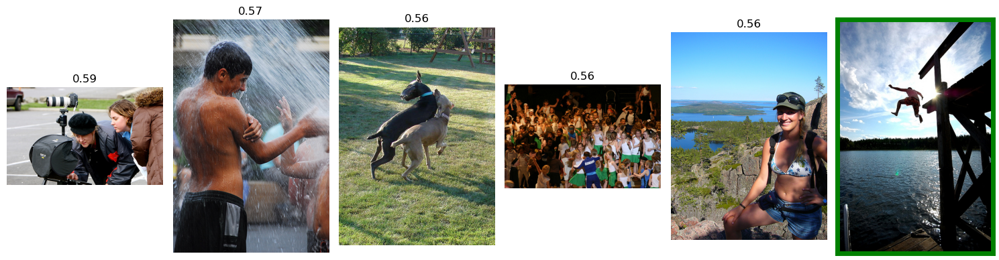


-------------------- Six men have a band practice in the woods . --------------------



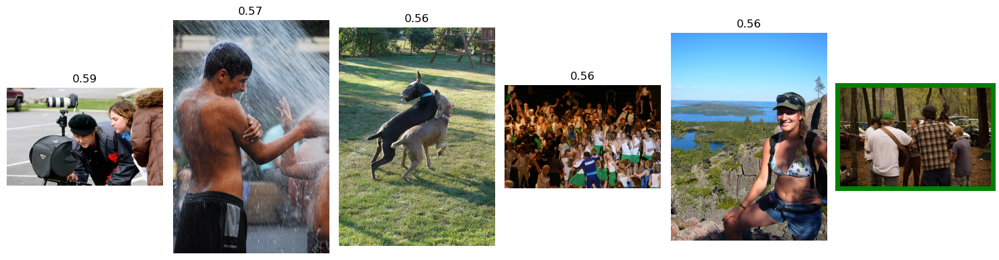


-------------------- The young boy flings mud at the barefoot girl in the pond . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A little girl blows out the candles on her cake . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A man sits on the gravel by an ocean . --------------------



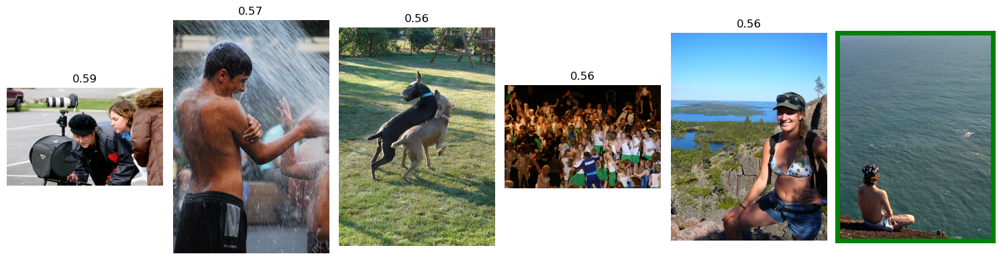


-------------------- A brown dog is carrying a stick too big for him over grass . --------------------



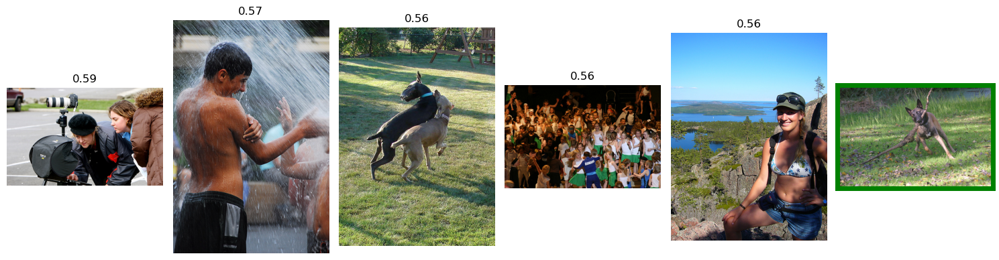


-------------------- The man is on a black and white bike . --------------------



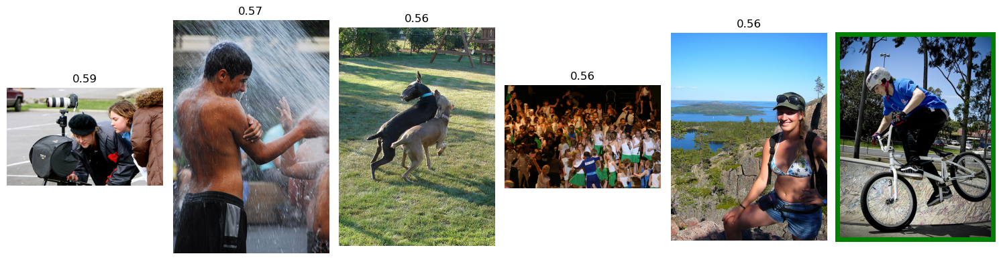


-------------------- Red boat marked GRAHAM races across water . --------------------



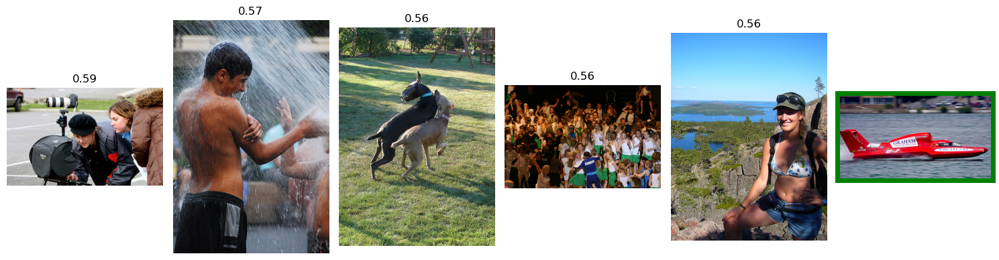


-------------------- A man , seen from the back , with his head turned to the side wearing a backpack --------------------



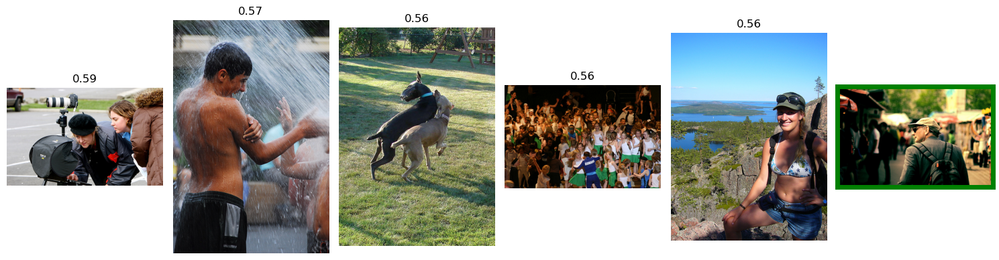


-------------------- A woman and a girl ride a sled down a hill standing up . --------------------

This image is unavailable in your country in compliance with local laws.



In [76]:
for query in queries:
    get_picture(query)

**Общие выводы**

В рамках данного проекта была создана и улучшена модель, способная комбинировать изображения и текстовые описания для поиска картинок по текстовым запросам. Хотя результаты достигнуты довольно не плохие, следует подчеркнуть, что модель не идеальна и иногда выдает некорректные изображения. Существуют возможности для ее дальнейшего совершенствования. В то же время, проект показывает свою практическую осуществимость, что можно продемонстрировать на практике.

Практическое внедрение поиска изображений по текстовым запросам может быть полезным в различных сферах, таких как веб-поиск. Этот проект обладает потенциалом для дальнейшего развития и оптимизации системы.

## 8. Выводы

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Исследовательский анализ данных выполнен
- [x]  Проверены экспертные оценки и краудсорсинговые оценки
- [x]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [x]  Изображения векторизованы
- [x]  Текстовые запросы векторизованы
- [x]  Данные корректно разбиты на тренировочную и тестовую выборки
- [x]  Предложена метрика качества работы модели
- [x]  Предложена модель схожести изображений и текстового запроса
- [x]  Модель обучена
- [x]  По итогам обучения модели сделаны выводы
- [x]  Проведено тестирование работы модели
- [x]  По итогам тестирования визуально сравнили качество поиска